In [ ]:
import os
import pandas as pd
import folium
import datetime
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
from collections import OrderedDict

In [ ]:
! pip install haversine

In [ ]:
from haversine import haversine

In [ ]:
DATA_PATH = 'data'

file_paths = [os.path.join(DATA_PATH, filename) for filename in sorted(os.listdir(DATA_PATH))]

In [ ]:
! pip install xlrd

In [ ]:
data_dfs = [pd.read_excel(file_path) for file_path in file_paths]

# 데이터 프레임

3개의 엑셀 파일을 하나의 데이터프레임으로 생성

In [ ]:
df = pd.concat(data_dfs).reset_index(drop=True).drop("Unnamed: 0", axis=1)
df

,fork_id,send_date,dvc_id,emp_x,emp_y,in_user,in_dt,up_user,up_dt,fork_type,emp_id,req_emp_id,req_emp_x,req_emp_y,status,req_date,accept_date,end_date,proj_no,ogan_code,ogan_name
0,HFL1005,2019-06-01 08:20:11,ITM.FRK_HFL1005,173753.462669,252318.443104,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.651,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
1,HFL1005,2019-06-01 08:20:21,ITM.FRK_HFL1005,173725.558119,252342.150967,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.619,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
2,HFL1005,2019-06-01 08:20:31,ITM.FRK_HFL1005,173527.526161,252155.980791,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.590,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
3,HFL1005,2019-06-01 08:20:41,ITM.FRK_HFL1005,173502.197368,252157.814599,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.558,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
4,HFL1005,2019-06-01 08:20:51,ITM.FRK_HFL1005,173487.381198,252141.904344,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.521,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938028,HFL6068,2019-06-30 16:05:30,NaN,174739.229951,254292.153886,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
938029,HFL6068,2019-06-30 16:05:40,NaN,174739.200414,254288.913808,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
938030,HFL6068,2019-06-30 16:06:07,NaN,174563.524422,253907.114465,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN
938031,HFL6068,2019-06-30 16:06:18,NaN,174740.248149,254280.043546,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN


# 좌표계 변환
지게차의 위치를 지도에 나타내기 위해 <br>
epsg 5187 좌표계를 epsg 4326 좌표계로 변환

In [ ]:
df[['emp_x', 'emp_y']].head()

,emp_x,emp_y
0,173753.462669,252318.443104
1,173725.558119,252342.150967
2,173527.526161,252155.980791
3,173502.197368,252157.814599
4,173487.381198,252141.904344


In [ ]:
!pip install pyproj

     |████████████████████████████████| 6.6MB 23.5MB/s 


In [ ]:
from pyproj import Proj, transform

In [ ]:
inProj = Proj(init='epsg:5187')
outProj = Proj(init='epsg:4326')
x1, y1 = df['emp_x'], df['emp_y']
x2, y2 = transform(inProj,outProj,x1,y1)
df['lat'] = y2
df['long'] = x2

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:306: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axi

#모든 지게차의 위치를 지도에 표시
지게차의 업무 영역 파악을 위해 데이터프레임에 존재하는 <br>
모든 지게차의 위치를 지도에 표시

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], zoom_start=14, prefer_canvas=True)

for i in range(len(df)):
  if i % 100 == 0:
    folium.Circle(location=df[['lat', 'long']].loc[i], radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opcity=0.7).add_to(m)
  
m

#지게차 별 위치 표시
지게차 별 업무 영역 파악을 위해 지게차별로 색깔을 다르게 하여 지도에 표시 <br>
<br>
지게차 별로 담당 구역이 있는 것으로 보이지만 어떤 지게차는 넓은 지역을 커버하는 것을 알 수 있음

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
          'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']


for i in range(len(df)):
  if i % 1000 == 0:
    if df.loc[i]['fork_id'] == 'HFL1005':
      folium.Circle(location=df[df['fork_id']=='HFL1005'][['lat', 'long']].loc[i], radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL1005').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL1007B':
      folium.Circle(location=df[df['fork_id']=='HFL1007B'][['lat', 'long']].loc[i], radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL1007B').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL1008':
      folium.Circle(location=df[df['fork_id']=='HFL1008'][['lat', 'long']].loc[i], radius=1, color='green', fill_color='green', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL1008').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL1691':
      folium.Circle(location=df[df['fork_id']=='HFL1691'][['lat', 'long']].loc[i], radius=1, color='purple', fill_color='purple', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL1691').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL1743':
      folium.Circle(location=df[df['fork_id']=='HFL1743'][['lat', 'long']].loc[i], radius=1, color='orange', fill_color='orange', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL1743').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL2798':
      folium.Circle(location=df[df['fork_id']=='HFL2798'][['lat', 'long']].loc[i], radius=1, color='darkred', fill_color='darkred', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL2798').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL2802':
      folium.Circle(location=df[df['fork_id']=='HFL2802'][['lat', 'long']].loc[i], radius=1, color='lightgreen', fill_color='lightgreen', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL2802').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL3794':
      folium.Circle(location=df[df['fork_id']=='HFL3794'][['lat', 'long']].loc[i], radius=1, color='darkblue', fill_color='darkblue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL3794').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL5364':
      folium.Circle(location=df[df['fork_id']=='HFL5364'][['lat', 'long']].loc[i], radius=1, color='darkgreen', fill_color='darkgreen', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5364').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL5384':
      folium.Circle(location=df[df['fork_id']=='HFL5384'][['lat', 'long']].loc[i], radius=1, color='cadetblue', fill_color='cadetblue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5384').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL5841':
      folium.Circle(location=df[df['fork_id']=='HFL5841'][['lat', 'long']].loc[i], radius=1, color='black', fill_color='black', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5841').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL5842':
      folium.Circle(location=df[df['fork_id']=='HFL5842'][['lat', 'long']].loc[i], radius=1, color='white', fill_color='white', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5842').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL6068':
      folium.Circle(location=df[df['fork_id']=='HFL6068'][['lat', 'long']].loc[i], radius=1, color='pink', fill_color='pink', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL6068').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL2800':
      folium.Circle(location=df[df['fork_id']=='HFL2800'][['lat', 'long']].loc[i], radius=1, color='lightblue', fill_color='lightblue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL2800').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL2228':
      folium.Circle(location=df[df['fork_id']=='HFL2228'][['lat', 'long']].loc[i], radius=1, color='lightgreen', fill_color='lightgreen', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL2228').add_to(m)
              
m

#넓은 구역을 커버하는 지게차의 위치 표시

상대적으로 넓은 구역을 커버하는 지게차의 업무 영역을 파악하기 위해 <br>
파란색 점으로 나타낸 1007B 지게차의 위치를 지도에 표시

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], zoom_start=14, 
               prefer_canvas=True, tiles='cartodbpositron')

df[df['fork_id'] == 'HFL1007B']

for i in range(len(df[df['fork_id'] == 'HFL1007B'])):
  if i % 100 == 0:
    folium.Circle(location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opacity=0.7, tooltip='HFL1007B').add_to(m)

m

# 넓은 영역을 커버하는 지게차의 위치를 일별로 표시
상대적으로 넓은 지역을 커버하는 지게차가 매일 넓은 지역을 담당하는 것인지 <br>
알아보기 위해 일별로 색깔을 다르게 하여 지도에 표시 <br> <br>
매일 넓은 지역을 커버하는 것은 아니고 일별로 다른 지역을 커버하는 것으로 보임

In [ ]:
df['date'] = pd.to_datetime(df['send_date'], format="%Y%m%d")

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], 
               zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

df[df['fork_id'] == 'HFL1007B']

df[df['date'].dt.date == pd.to_datetime('2019-06-10')]

for i in range(len(df[df['fork_id'] == 'HFL1007B'])):
  if i % 100 == 0:
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-10') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-10'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-25') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-15'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-20') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='green', fill_color='green', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-20'
        ).add_to(m)
m

#휴식 시간과 근로 시간의 비율을 지게차별로 표시
어떤 지게차가 휴식 비율이 높고 어떤 지게차가 근로 비율이 높은지 파악<br>

분석결과 : 5841과 5842는 근로 시간이 비슷하지만 근로시간 비율은 
5841이 5842에 비해 두배가량 높은 것을 알 수 있음

In [ ]:
plot1_0 = []
for vehicle in df['fork_id'].unique() :
  plot1_0.append(len(df[(df['fork_id'] == vehicle) & (df['status'] == 0)]))

In [ ]:
plot1_1 = []
for vehicle in df['fork_id'].unique() :
  plot1_1.append(len(df[(df['fork_id'] == vehicle) & (df['status'] == 1)]))

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
 <a list of 15 Text major ticklabel objects>)

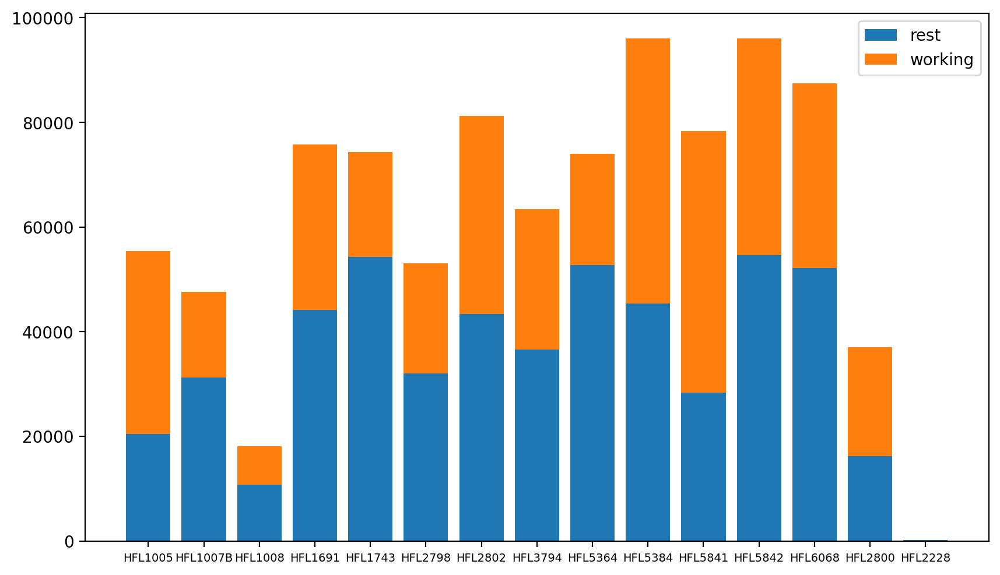

In [ ]:
plt.figure(figsize=(10,6), dpi=200)
p1 = plt.bar(df['fork_id'].unique(), plot1_0)
p2 = plt.bar(df['fork_id'].unique(), plot1_1, bottom=plot1_0)
plt.legend((p1[0], p2[0]), ('rest', 'working'), fontsize=10)
plt.xticks(fontsize=7)

In [ ]:
plot1_ratio = []

for i in range(len(plot1_0)) :
  plot1_ratio.append(plot1_1[i]/plot1_0[i])

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
 <a list of 15 Text major ticklabel objects>)

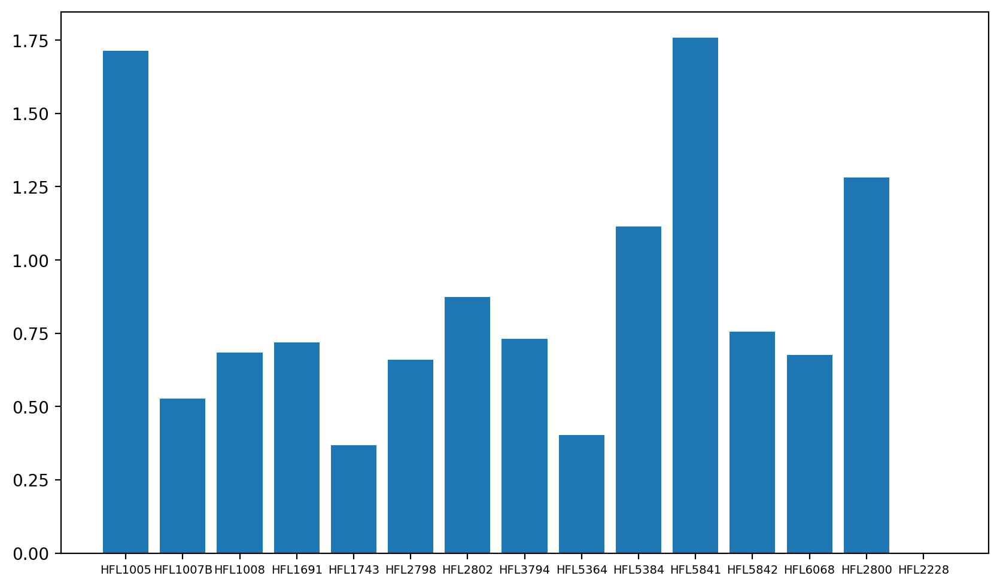

In [ ]:
plt.figure(figsize=(10,6), dpi=200)
plt.bar(df['fork_id'].unique(), plot1_ratio)
plt.xticks(fontsize=7)

#근로 시간 비율에 어떤 요소가 영향을 미쳤는지 파악
해당 요소를 파악하기 위해 5841과 5842의 위치를 지도에 표시 <br>

결과 : 근로시간 비율이 높은 5841이 더 넓은 구역을 담당하는 것을 알 수 있음<br>
하지만 마찬가지로 넓은 구역을 담당하는 1007B 아저씨의 근로시간 비율은 낮음<br>

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

for i in range(len(df)):
  if i % 1000 == 0:
    if df.loc[i]['fork_id'] == 'HFL5841':
      folium.Circle(location=df[df['fork_id']=='HFL5841'][['lat', 'long']].loc[i], radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5841').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL5842':
      folium.Circle(location=df[df['fork_id']=='HFL5842'][['lat', 'long']].loc[i], radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5842').add_to(m)        
m

#5841 아저씨가 바쁜 이유를 분석
이를 분석하기 위해 아저씨의 행적을 날짜별로 지도에 표시<br><br> 

분석 결과 1007B 아저씨와는 다르게 매일 넓은 지역을 커버하는 것을 알 수 있음

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], 
               zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

for i in range(len(df[df['fork_id'] == 'HFL5841'])):
  if i % 100 == 0:
    if df[df['fork_id'] == 'HFL5841'].iloc[i]['date'].date() == pd.Timestamp('2019-06-10') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL5841'][['lat', 'long']].iloc[i], 
          radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-10'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL5841'].iloc[i]['date'].date() == pd.Timestamp('2019-06-25') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL5841'][['lat', 'long']].iloc[i], 
          radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-15'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL5841'].iloc[i]['date'].date() == pd.Timestamp('2019-06-20') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL5841'][['lat', 'long']].iloc[i], 
          radius=1, color='green', fill_color='green', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-20'
        ).add_to(m)
m

#근로시간 비율에 영향을 미치는 다른 요소
또 다른 요소가 있는지 파악하기 위해 5841 아저씨와 마찬가지로 매일 넓은 구역을 돌아다니는 2802 아저씨를 분석 <br><br>

분석 결과 2802 아저씨 또한 매일 넓은 지역을 돌아다니는 반면 2802 아저씨의 근로 시간 비율은 낮음

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

for i in range(len(df)):
  if i % 1000 == 0:
    if df.loc[i]['fork_id'] == 'HFL5841':
      folium.Circle(location=df[df['fork_id']=='HFL5841'][['lat', 'long']].loc[i], radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL5841').add_to(m)
    if df.loc[i]['fork_id'] == 'HFL2802':
      folium.Circle(location=df[df['fork_id']=='HFL2802'][['lat', 'long']].loc[i], radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opcity=0.7, tooltip='HFL2802').add_to(m)        
m

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], 
               zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

for i in range(len(df[df['fork_id'] == 'HFL2802'])):
  if i % 100 == 0:
    if df[df['fork_id'] == 'HFL2802'].iloc[i]['date'].date() == pd.Timestamp('2019-06-10') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL2802'][['lat', 'long']].iloc[i], 
          radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-10'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL2802'].iloc[i]['date'].date() == pd.Timestamp('2019-06-25') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL2802'][['lat', 'long']].iloc[i], 
          radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-15'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL2802'].iloc[i]['date'].date() == pd.Timestamp('2019-06-20') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL2802'][['lat', 'long']].iloc[i], 
          radius=1, color='green', fill_color='green', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-20'
        ).add_to(m)
m

# 2802 아저씨의 낮은 근로 시간 비율에 영향을 미치는 요소 파악
해당 요소를 파악하기 위해 2802 아저씨와 5841 아저씨의 시간별 동선을 지도에 표시<br><br>

2802 아저씨의 이동거리가 길게 계산된 이유는 초밥을 먹으러 가는데 기기를 들고 가서임

In [ ]:
df_5841_1 = df[(df['fork_id'] == 'HFL5841') & (df['date'].dt.date == pd.Timestamp('2019-06-10'))].sort_values(by=['send_date'])[['lat','long']]
df_5841_2 = df[(df['fork_id'] == 'HFL5841') & (df['date'].dt.date == pd.Timestamp('2019-06-20'))].sort_values(by=['send_date'])[['lat','long']]
df_5841_3 = df[(df['fork_id'] == 'HFL5841') & (df['date'].dt.date == pd.Timestamp('2019-06-25'))].sort_values(by=['send_date'])[['lat','long']]
df_2802_1 = df[(df['fork_id'] == 'HFL2802') & (df['date'].dt.date == pd.Timestamp('2019-06-10'))].sort_values(by=['send_date'])[['lat','long']]
df_2802_2 = df[(df['fork_id'] == 'HFL2802') & (df['date'].dt.date == pd.Timestamp('2019-06-21'))].sort_values(by=['send_date'])[['lat','long']]
df_2802_3 = df[(df['fork_id'] == 'HFL2802') & (df['date'].dt.date == pd.Timestamp('2019-06-25'))].sort_values(by=['send_date'])[['lat','long']]

In [ ]:
#df_5841_1 = df_5841_1.sample(n=int(len(df_5841_1)/10))
#df_5841_2 = df_5841_2.sample(n=int(len(df_5841_2)/10))
#df_5841_3 = df_5841_3.sample(n=int(len(df_5841_3)/10))
#df_2802_1 = df_2802_1.sample(n=int(len(df_2802_1)/10))
#df_2802_2 = df_2802_2.sample(n=int(len(df_2802_2)/10))
#df_2802_3 = df_2802_3.sample(n=int(len(df_2802_3)/10))

#df_2802_2.sort_values(by=['lat'])

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], 
               zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

folium.PolyLine(locations=df_5841_1.values.tolist(), color='blue', tooltip='5841').add_to(m)
folium.PolyLine(locations=df_5841_2.values.tolist(), color='red', tooltip='5841').add_to(m)
folium.PolyLine(locations=df_5841_3.values.tolist(), color='green', tooltip='5841').add_to(m)

m

In [ ]:
m = folium.Map(location=[34.87651960135897, 128.70903006693902], 
               zoom_start=14, prefer_canvas=True, tiles='cartodbpositron')

folium.PolyLine(locations=df_2802_1.values.tolist(), color='blue', tooltip='2802_1').add_to(m)
folium.PolyLine(locations=df_2802_2.values.tolist(), color='red', tooltip='2802_2').add_to(m)
folium.PolyLine(locations=df_2802_3.values.tolist(), color='green', tooltip='2802_3').add_to(m)

m

#Haversine을 이용하여 이동거리를 계산
이동거리가 근로시간에 영향을 미친다고 가정하고 지게차별 이동거리를 계산

In [ ]:
def haversine_np(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [ ]:
df2 = df[df['status'] == 1].sample(n=int(len(df[df['status'] == 1])/40))

In [ ]:
len(df2)

10385

In [ ]:
dict_temp = OrderedDict()
for vehicle in df['fork_id'].unique():
  list_temp = []
  for j in range(len(df2[df2['fork_id'] == vehicle][:-1])):
    list_temp.append(
    haversine_np(
      df2[df2['fork_id'] == vehicle]['long'].iloc[j],
      df2[df2['fork_id'] == vehicle]['lat'].iloc[j], 
      df2[df2['fork_id'] == vehicle]['long'].shift(-1).iloc[j],
      df2[df2['fork_id'] == vehicle]['lat'].shift(-1).iloc[j]
      ))
  dict_temp[vehicle] = sum(list_temp)

dict_temp

OrderedDict([('HFL1005', 487.5792360687569),
             ('HFL1007B', 329.0955995077572),
             ('HFL1008', 62.98432928779218),
             ('HFL1691', 610.5123121344939),
             ('HFL1743', 389.19608221012476),
             ('HFL2798', 346.92730050330994),
             ('HFL2802', 842.7622342332331),
             ('HFL3794', 599.7897927115841),
             ('HFL5364', 322.22854252806104),
             ('HFL5384', 659.199512692262),
             ('HFL5841', 877.870968391712),
             ('HFL5842', 231.68543595431674),
             ('HFL6068', 602.2126952081773),
             ('HFL2800', 286.66210499245136),
             ('HFL2228', 0)])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text major ticklabel objects>)

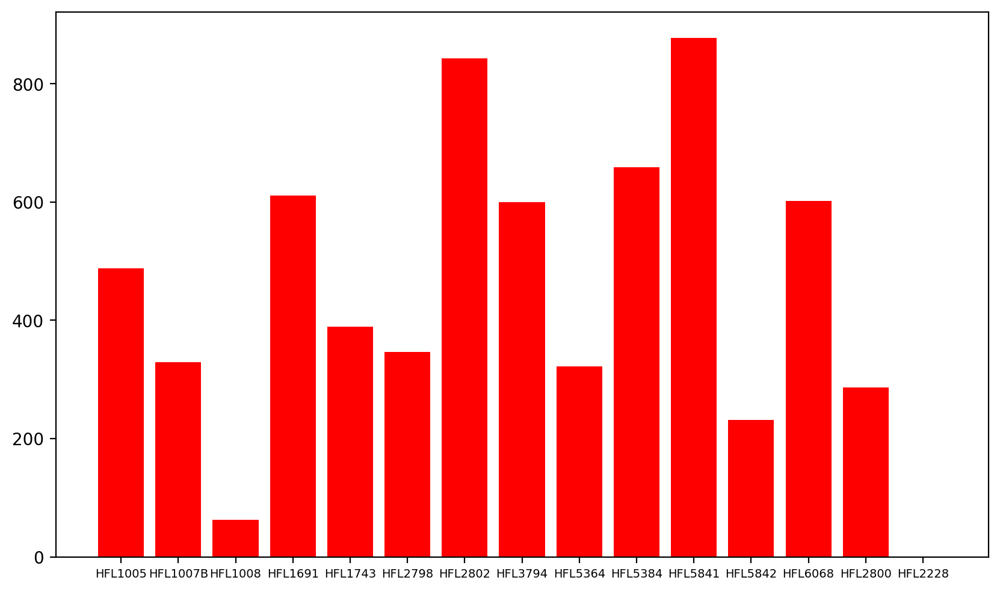

In [ ]:
plt.figure(figsize=(10,6), dpi=200)
plt.bar(range(len(dict_temp)), list(dict_temp.values()), align='center', color='red')
plt.xticks(range(len(dict_temp)), list(dict_temp.keys()))
plt.xticks(fontsize=7)

In [ ]:
class my_Map:
  def __init__(self,df):
    self.df = df

  def trans_loc(self):
    x1,y1 = self.df['emp_x'], df['emp_y']
    x2,y2 = transform(inProj,outProj,x1,y1)
    self.df['lat'] = y2
    self.df['long'] = x2

  def draw_map(self, id = self.df['fork_id'].unique(), date = self.df['date'].date().unique()):
    for i in id:
      

In [ ]:
M = my_Map(df)
M.trans_loc()
M.df

for i in range(len(df[df['fork_id'] == 'HFL1007B'])):
  if i % 100 == 0:
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-10') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='blue', fill_color='blue', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-10'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-25') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='red', fill_color='red', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-15'
        ).add_to(m)
    if df[df['fork_id'] == 'HFL1007B'].iloc[i]['date'].date() == pd.Timestamp('2019-06-20') :
        folium.Circle(
          location=df[df['fork_id'] == 'HFL1007B'][['lat', 'long']].iloc[i], 
          radius=1, color='green', fill_color='green', fill_opacity=0.7, line_opacity=0.7, 
          tooltip='2019-06-20'
        ).add_to(m)
m

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  import sys


,fork_id,send_date,dvc_id,emp_x,emp_y,in_user,in_dt,up_user,up_dt,fork_type,emp_id,req_emp_id,req_emp_x,req_emp_y,status,req_date,accept_date,end_date,proj_no,ogan_code,ogan_name,lat,long,date
0,HFL1005,2019-06-01 08:20:11,ITM.FRK_HFL1005,173753.462669,252318.443104,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.651,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.866467,128.712953,2019-06-01 08:20:11
1,HFL1005,2019-06-01 08:20:21,ITM.FRK_HFL1005,173725.558119,252342.150967,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.619,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.866680,128.712647,2019-06-01 08:20:21
2,HFL1005,2019-06-01 08:20:31,ITM.FRK_HFL1005,173527.526161,252155.980791,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.590,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.864997,128.710487,2019-06-01 08:20:31
3,HFL1005,2019-06-01 08:20:41,ITM.FRK_HFL1005,173502.197368,252157.814599,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.558,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.865013,128.710210,2019-06-01 08:20:41
4,HFL1005,2019-06-01 08:20:51,ITM.FRK_HFL1005,173487.381198,252141.904344,CMM.CmmWork.TH RunSyncForkLift,2019-06-01 08:30:50.521,NaN,NaN,7,6373444,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.864869,128.710049,2019-06-01 08:20:51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938028,HFL6068,2019-06-30 16:05:30,NaN,174739.229951,254292.153886,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.884283,128.723674,2019-06-30 16:05:30
938029,HFL6068,2019-06-30 16:05:40,NaN,174739.200414,254288.913808,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.884254,128.723674,2019-06-30 16:05:40
938030,HFL6068,2019-06-30 16:06:07,NaN,174563.524422,253907.114465,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.880808,128.721764,2019-06-30 16:06:07
938031,HFL6068,2019-06-30 16:06:18,NaN,174740.248149,254280.043546,NaN,NaT,NaN,NaN,7,6358808,NaN,NaN,NaN,0,NaT,NaT,NaT,NaN,NaN,NaN,34.884174,128.723686,2019-06-30 16:06:18
